Tecnocasa, leader nella vendita di appartamenti, ville e terreni, ha commissionato uno studio riguardante la Lombardia per vedere quali sono le aree migliori in cui concentrare la ricerca di nuove case da vendere. 
Nel dettaglio, sono interessati ad avere le seguenti informazioni:

In [ ]:
!pip install geopandas
!pip install contextily

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%matplotlib inline
import pandas as pd
import geopandas
import contextily
from shapely.geometry import Point
import matplotlib.pyplot as plt

**1. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero**

In [ ]:
comuni = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Mappa Italia/Com01012021_g')

In [ ]:
Regioni = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Mappa Italia/Reg01012021_g")
lombardia = Regioni[Regioni["DEN_REG"] == "Lombardia"].geometry.squeeze()
lombardia

In [ ]:
lomba = comuni[comuni.within(lombardia)]
lomba

In [ ]:
'''comuni['Shape_Area']=comuni['Shape_Area']/10000

comuni_10 = comuni[comuni['Shape_Area']<1000]
comuni_10

comuni_10_lombardia = comuni_10[comuni_10['COD_REG']==3]
comuni_10_lombardia'''

In [ ]:
comuni_10 = lomba[lomba.area < 10**7]
comuni_10

In [ ]:
ax = comuni_10.to_crs(epsg=3857).plot(figsize= (15, 15),facecolor= "Green",alpha=0.5 ,edgecolor="k", linewidth=1)
contextily.add_basemap(ax)

**2. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq e che si trovano all'interno di un parco: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero. Visualizzare anche i parchi**

In [ ]:
parchi = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Parchi_regionali_e_nazionali_polygon.zip')
parchi 

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


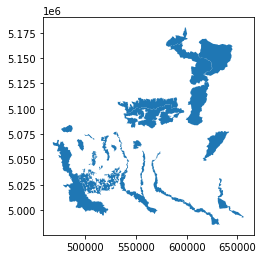

In [ ]:
parchi_sq = parchi.geometry.squeeze()
parchi_sq.plot()

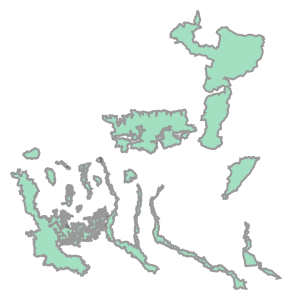

In [ ]:
parchi_union = parchi_sq.unary_union
parchi_union

In [ ]:
comuni_parco = comuni_10[comuni_10.intersects(parchi_union)]
comuni_parco

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1454,1,3,12,0,12,12007,012007,Azzio,None,0,7602.953671,2.172798e+06,"POLYGON ((477914.331 5082436.678, 477696.259 5..."
1455,1,3,12,0,12,12008,012008,Barasso,None,0,10877.705348,3.872669e+06,"POLYGON ((481124.582 5079579.276, 481862.732 5..."
1457,1,3,12,0,12,12010,012010,Bedero Valcuvia,None,0,7365.876080,2.865177e+06,"POLYGON ((484765.337 5085237.234, 484983.273 5..."
1459,1,3,12,0,12,12012,012012,Besnate,None,0,10817.357855,7.273893e+06,"POLYGON ((481260.113 5062375.402, 481568.048 5..."
1468,1,3,12,0,12,12021,012021,Brinzio,None,0,11411.097228,6.331554e+06,"POLYGON ((485212.146 5082260.257, 485813.047 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7733,1,3,108,0,108,108043,108043,Triuggio,None,0,13806.322570,8.161271e+06,"POLYGON ((521843.043 5059181.585, 521821.278 5..."
7736,1,3,108,0,108,108046,108046,Vedano al Lambro,None,0,6424.406511,2.078120e+06,"POLYGON ((521763.469 5052046.216, 521702.783 5..."
7737,1,3,108,0,108,108047,108047,Veduggio con Colzano,None,0,7986.758681,3.390555e+06,"POLYGON ((519686.705 5065270.380, 519754.706 5..."
7738,1,3,108,0,108,108048,108048,Verano Brianza,None,0,9171.724083,3.667862e+06,"POLYGON ((517613.394 5060787.396, 518293.122 5..."


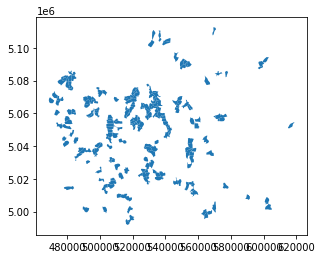

In [ ]:
comuni_parco.plot()

In [ ]:
'''comuni_parco = comuni_10[comuni_10.intersects(parchi.geometry.squeeze().unary_union)]
comuni_parco'''

'comuni_parco = comuni_10[comuni_10.intersects(parchi.geometry.squeeze().unary_union)]\ncomuni_parco'

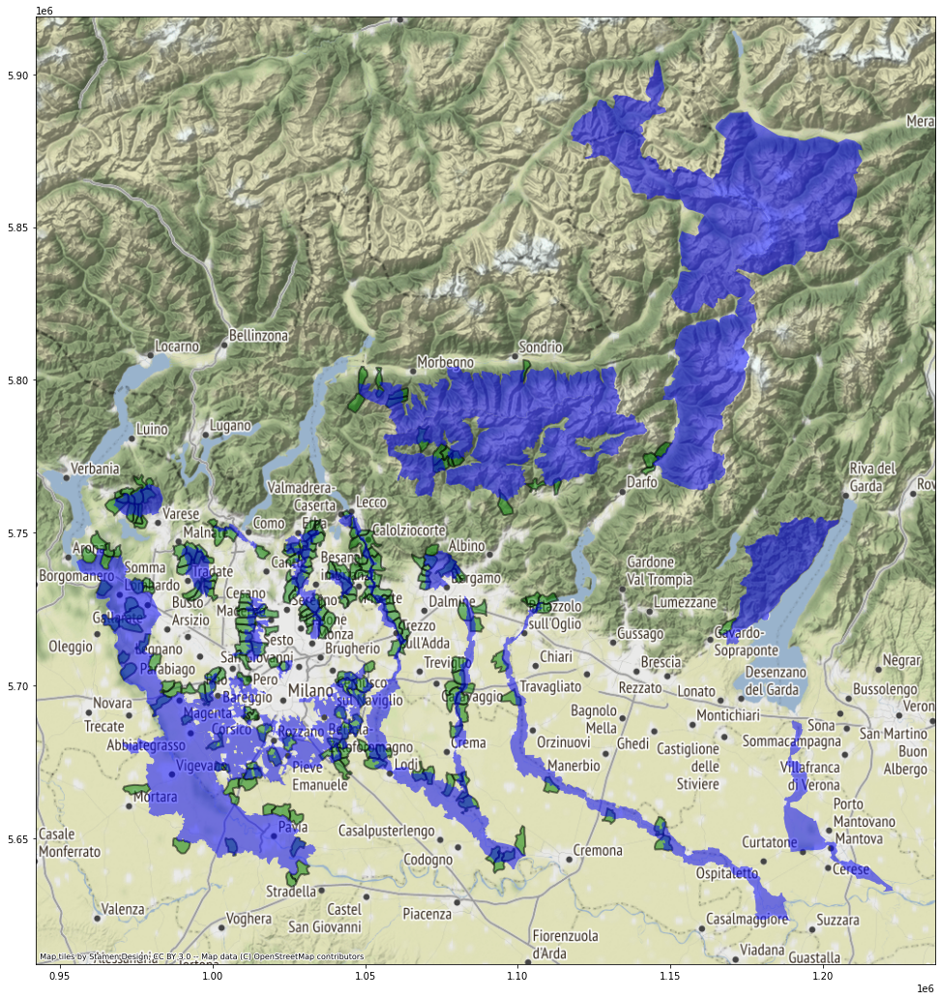

In [ ]:
ax = comuni_parco.to_crs(epsg=3857).plot(figsize=(18, 18), linewidth=2, facecolor='green', edgecolor='k', alpha=0.5)
parchi.to_crs(epsg=3857).plot(ax=ax, linewidth=2, facecolor='blue', alpha=0.5)
contextily.add_basemap(ax)

**3. l'elenco dei comuni che hanno un'area inferiore ai 10 kmq, che si trovano all'interno di un parco e sono attraversati da un corso d'acqua: visualizzare il numero, l'elenco e la mappa  con tutti i comuni colorati in verde (trasparente) e bordati di nero. Visualizzare anche i corsi d'acqua**

In [ ]:
corsi_acqua = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Corsi_acqua_Piano_di_Gestione.zip')
corsi_acqua

In [ ]:
comuni_parco_acqua = comuni_parco[comuni_parco.intersects(corsi_acqua.squeeze().unary_union)]
comuni_parco_acqua

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1814,1,3,15,215,215,15009,015009,Arese,None,0,14252.406342,6.317493e+06,"POLYGON ((506416.116 5045124.529, 506782.458 5..."
1816,1,3,15,215,215,15011,015011,Assago,None,0,12853.544196,8.397610e+06,"POLYGON ((511386.603 5029333.275, 511518.968 5..."
1820,1,3,15,215,215,15016,015016,Bellinzago Lombardo,None,0,9152.448694,4.757102e+06,"POLYGON ((535820.585 5042807.544, 535955.584 5..."
1823,1,3,15,215,215,15024,015024,Binasco,None,0,9525.254316,3.723066e+06,"POLYGON ((508210.226 5020682.712, 508814.066 5..."
1824,1,3,15,215,215,15026,015026,Boffalora sopra Ticino,None,0,16553.572708,7.886343e+06,"POLYGON ((488110.220 5035684.100, 489257.268 5..."
1826,1,3,15,215,215,15032,015032,Bresso,None,0,7156.575704,3.541098e+06,"POLYGON ((514613.122 5043643.623, 515033.668 5..."
1829,1,3,15,215,215,15038,015038,Buscate,None,0,12689.441322,7.638030e+06,"POLYGON ((485539.958 5045650.525, 485536.957 5..."
1837,1,3,15,215,215,15055,015055,Casarile,None,0,12227.610879,8.076246e+06,"POLYGON ((508337.975 5019223.222, 508394.944 5..."
1840,1,3,15,215,215,15060,015060,Cassina de' Pecchi,None,0,13733.639449,7.222453e+06,"POLYGON ((528919.635 5041318.557, 529582.632 5..."
1841,1,3,15,215,215,15061,015061,Cassinetta di Lugagnano,None,0,8392.126482,3.624219e+06,"POLYGON ((493127.901 5031226.632, 493816.897 5..."


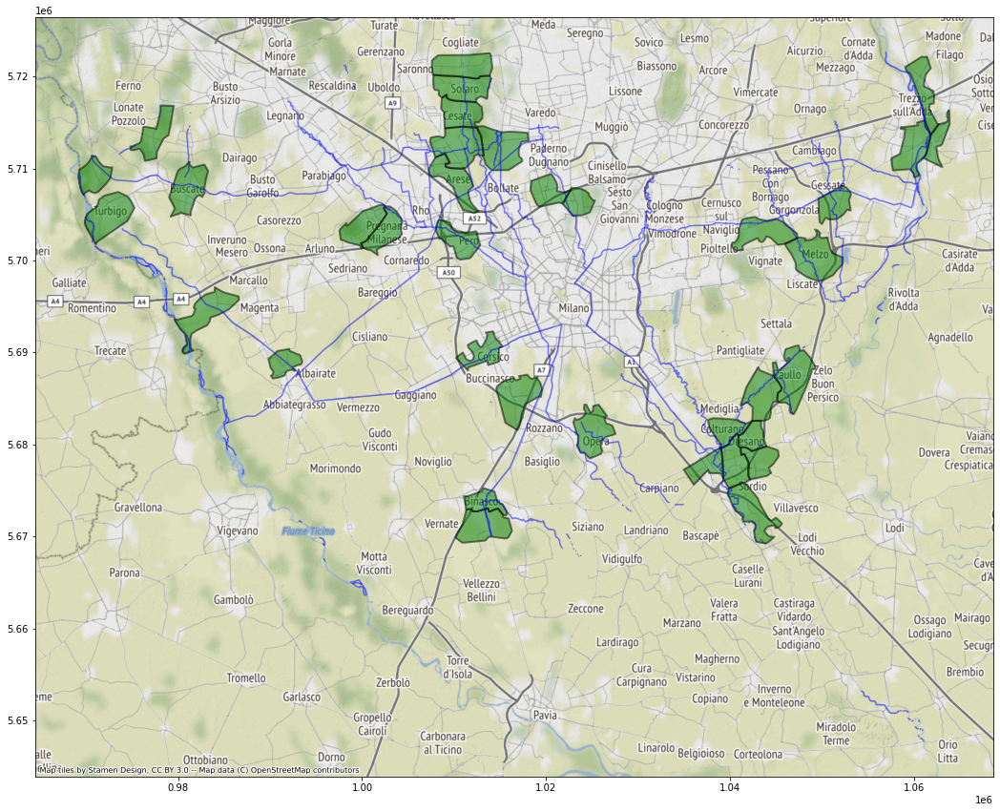

In [ ]:
ax = comuni_parco_acqua.to_crs(epsg=3857).plot(figsize=(18, 18), linewidth=2, facecolor='green', edgecolor='k', alpha=0.5)
corsi_acqua.to_crs(epsg=3857).plot(ax=ax, edgecolor='blue', alpha=0.5)
contextily.add_basemap(ax)

**4. l'elenco dei comuni che si trovano a più di 1 km da un'autostrada: visualizzare il numero, l'elenco e una mappa con in rosso i comuni che si trovano a meno di 1 km e in verde gli altri (vedi immagine allegata)**

In [ ]:
autostrade = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Autostrade_10000_CT10_line.zip')
autostrade

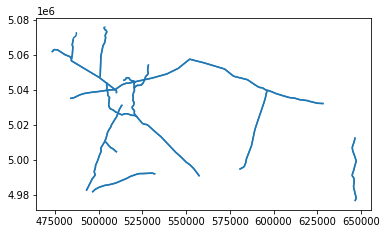

In [ ]:
autostrade.plot()

In [ ]:
autostrade.crs

<Projected CRS: EPSG:32632>
Name: WGS 84 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 6°E and 12°E, northern hemisphere between equator and 84°N, onshore and offshore. Algeria. Austria. Cameroon. Denmark. Equatorial Guinea. France. Gabon. Germany. Italy. Libya. Liechtenstein. Monaco. Netherlands. Niger. Nigeria. Norway. Sao Tome and Principe. Svalbard. Sweden. Switzerland. Tunisia. Vatican City State.
- bounds: (6.0, 0.0, 12.0, 84.0)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
comuni_lombardia = comuni[comuni['COD_REG']==3]
comuni_lombardia

In [ ]:
comuni_lontano_autostrada = comuni_lombardia[comuni_lombardia.distance(autostrade.unary_union)>1000]
comuni_lontano_autostrada

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1448,1,3,12,0,12,12001,012001,Agra,None,0,6996.108320,2.942389e+06,"POLYGON ((482802.662 5097733.142, 482784.662 5..."
1450,1,3,12,0,12,12003,012003,Angera,None,0,24194.847570,1.748219e+07,"POLYGON ((470218.756 5071198.335, 470937.656 5..."
1451,1,3,12,0,12,12004,012004,Arcisate,None,0,19072.979574,1.229388e+07,"POLYGON ((488207.686 5080963.765, 488368.654 5..."
1454,1,3,12,0,12,12007,012007,Azzio,None,0,7602.953671,2.172798e+06,"POLYGON ((477914.331 5082436.678, 477696.259 5..."
1455,1,3,12,0,12,12008,012008,Barasso,None,0,10877.705348,3.872669e+06,"POLYGON ((481124.582 5079579.276, 481862.732 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7737,1,3,108,0,108,108047,108047,Veduggio con Colzano,None,0,7986.758681,3.390555e+06,"POLYGON ((519686.705 5065270.380, 519754.706 5..."
7738,1,3,108,0,108,108048,108048,Verano Brianza,None,0,9171.724083,3.667862e+06,"POLYGON ((517613.394 5060787.396, 518293.122 5..."
7739,1,3,108,0,108,108049,108049,Villasanta,None,0,9629.121636,4.645122e+06,"POLYGON ((523356.646 5052024.704, 523490.961 5..."
7743,1,3,108,0,108,108053,108053,Cornate d'Adda,None,0,15414.910444,1.364665e+07,"POLYGON ((537678.573 5057235.438, 537951.570 5..."


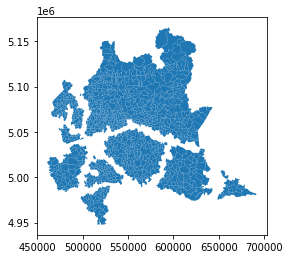

In [ ]:
comuni_lontano_autostrada.plot()

In [ ]:
comuni_vicino_autostrada = comuni_lombardia[comuni_lombardia.distance(autostrade.unary_union)<1000]
comuni_vicino_autostrada

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1449,1,3,12,0,12,12002,012002,Albizzate,None,0,9255.748026,3.813831e+06,"POLYGON ((485235.221 5064709.066, 485545.361 5..."
1452,1,3,12,0,12,12005,012005,Arsago Seprio,None,0,15318.402658,1.053346e+07,"POLYGON ((478637.631 5063107.396, 478750.600 5..."
1453,1,3,12,0,12,12006,012006,Azzate,None,0,11761.330818,4.536471e+06,"POLYGON ((483900.127 5071449.880, 484020.211 5..."
1459,1,3,12,0,12,12012,012012,Besnate,None,0,10817.357855,7.273893e+06,"POLYGON ((481260.113 5062375.402, 481568.048 5..."
1470,1,3,12,0,12,12023,012023,Brunello,None,0,5605.506138,1.721869e+06,"POLYGON ((484663.462 5068720.354, 484936.086 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7734,1,3,108,0,108,108044,108044,Usmate Velate,None,0,14276.627617,9.719044e+06,"POLYGON ((527095.650 5057351.438, 527786.020 5..."
7740,1,3,108,0,108,108050,108050,Vimercate,None,0,24791.429563,2.059253e+07,"POLYGON ((527733.646 5054237.461, 527716.646 5..."
7741,1,3,108,0,108,108051,108051,Busnago,None,0,11376.029586,5.834750e+06,"POLYGON ((535742.586 5052473.474, 535839.585 5..."
7742,1,3,108,0,108,108052,108052,Caponago,None,0,11874.711735,4.807794e+06,"POLYGON ((530927.622 5047008.514, 530890.358 5..."


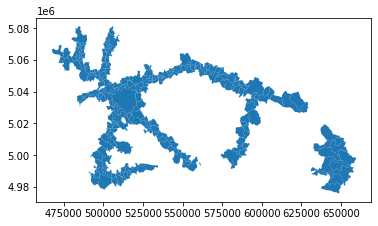

In [ ]:
comuni_vicino_autostrada.plot()

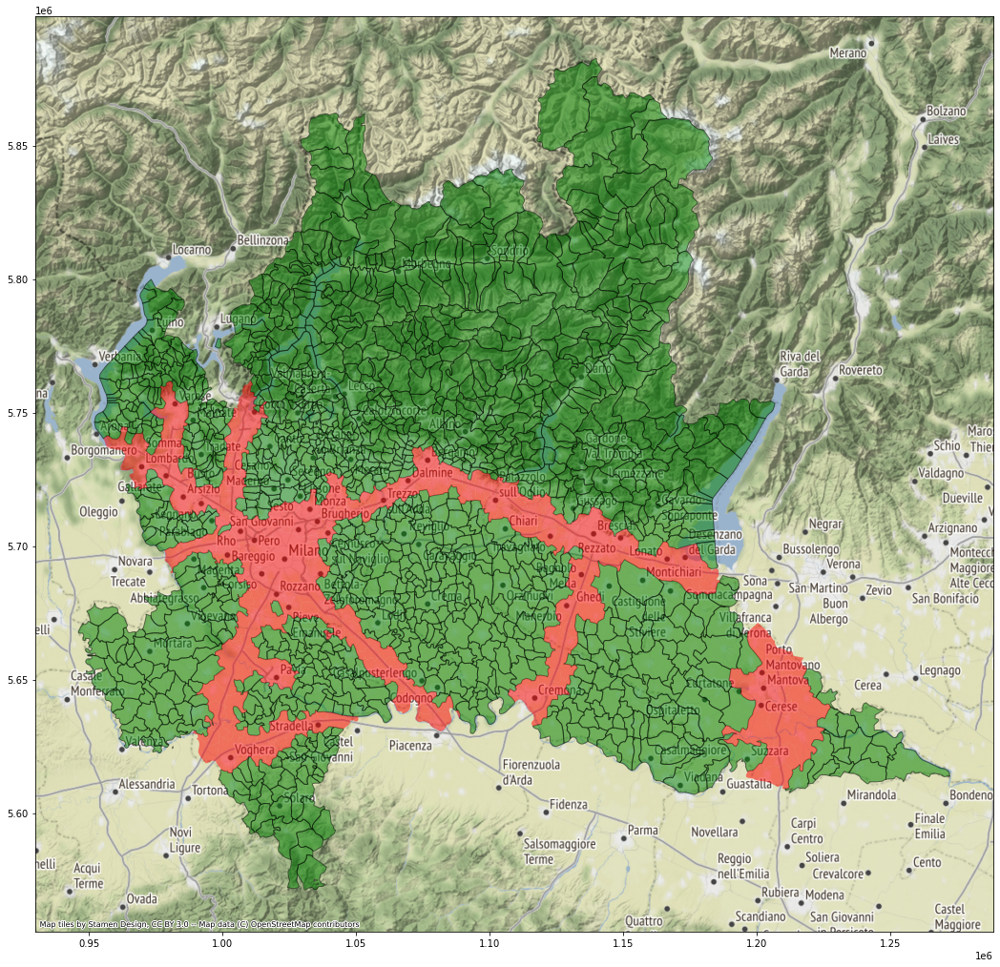

In [ ]:
ax = comuni_lontano_autostrada.to_crs(epsg=3857).plot(figsize=(18, 18), facecolor='green', edgecolor='k', alpha=0.5)
comuni_vicino_autostrada.to_crs(epsg=3857).plot(ax=ax, facecolor='red', alpha=0.5)
contextily.add_basemap(ax)

**5. l'elenco dei quartieri di Milano attraversati da una autostrada: visualizzare una mappa con i quartieri. Aggiungere anche il nome del quartiere sulla mappa.**

In [ ]:
quartieri_milano = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/quartieri di Milano/ds964_nil_wm.zip')

In [ ]:
quartieri_milano.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
quartieri_autostrada = quartieri_milano[quartieri_milano.intersects(autostrade.to_crs(epsg=4326).unary_union)]
quartieri_autostrada

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((9.08375 45.48485, 9.08280 45.48521, ..."
7,76,QUARTO OGGIARO - VIALBA - MUSOCCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7138.355680,2.776872e+06,96,"POLYGON ((9.13481 45.52095, 9.13481 45.52094, ..."
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((9.08375 45.48485, 9.08444 45.48459, ..."
16,43,TIBALDI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3964.077498,7.861846e+05,105,"POLYGON ((9.18775 45.43732, 9.18644 45.43733, ..."
22,75,STEPHENSON,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3582.570059,5.600844e+05,111,"POLYGON ((9.13009 45.50820, 9.13016 45.50784, ..."
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((9.16112 45.42589, 9.16270 45.42544, ..."
26,46,BARONA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6836.011433,2.006249e+06,115,"POLYGON ((9.16112 45.42589, 9.16056 45.42605, ..."
27,71,VILLAPIZZONE - CAGNOLA - BOLDINASCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8375.003494,3.426941e+06,116,"POLYGON ((9.16204 45.49690, 9.16012 45.49570, ..."
28,88,PARCO BOSCO IN CITTA',05/02/2020,Vigente,Milano 2030 - PGT Approvato,37072.981211,7.834006e+06,117,"POLYGON ((9.07309 45.50604, 9.07326 45.50589, ..."
31,32,TRIULZO SUPERIORE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6923.734083,1.389578e+06,120,"POLYGON ((9.26378 45.43251, 9.26384 45.43248, ..."


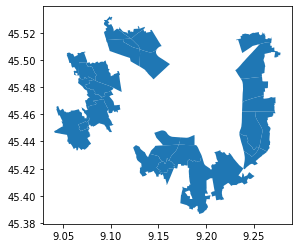

In [ ]:
quartieri_autostrada.plot()

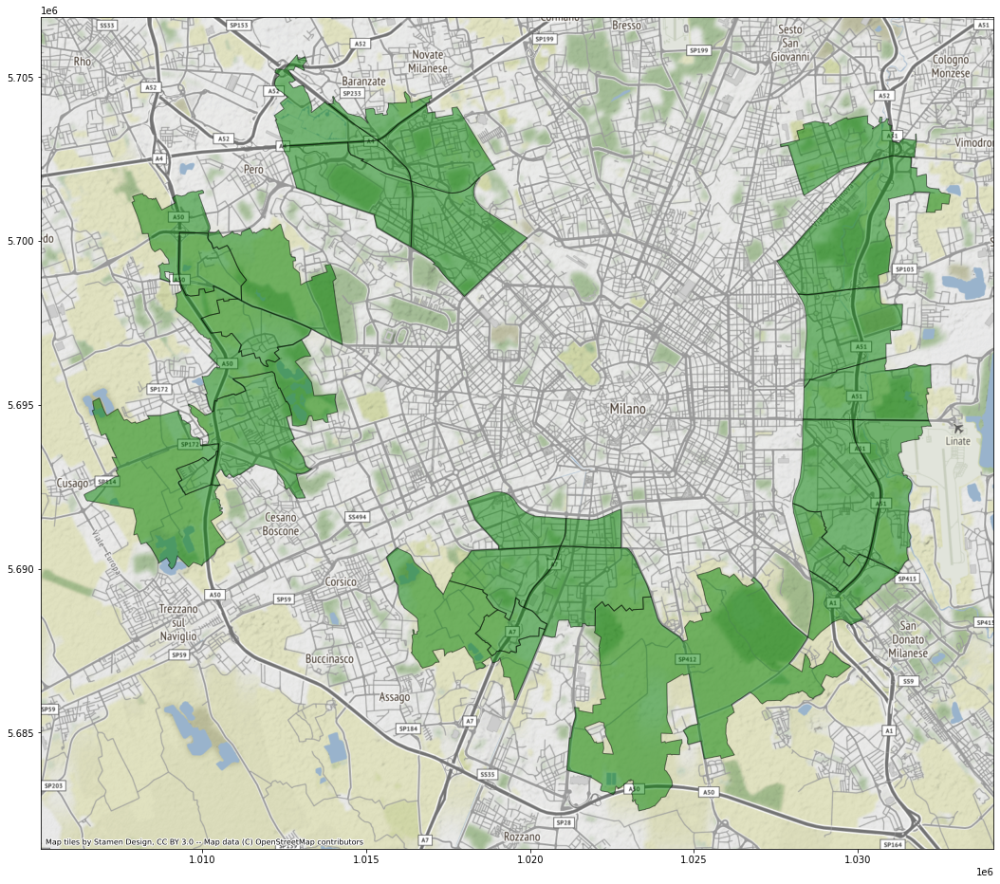

In [ ]:
ax = quartieri_autostrada.to_crs(epsg=3857).plot(figsize=(18, 18), facecolor='green', edgecolor='k', alpha=0.5)
contextily.add_basemap(ax)

In [ ]:
quartieri_autostradaCopy = quartieri_autostrada.copy()
quartieri_autostradaCopy

In [ ]:
quartieri_autostradaCopy = quartieri_autostradaCopy.to_crs(epsg=3857)
quartieri_autostradaCopy.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
quartieri_autostradaCopy["coords"] = quartieri_autostradaCopy["geometry"].apply(lambda x: x.representative_point().coords[:])
quartieri_autostradaCopy.head(5)

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry,coords
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((1011198.900 5698176.961, 1011092.872...","[(1010190.3166120737, 5699170.107388781)]"
7,76,QUARTO OGGIARO - VIALBA - MUSOCCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7138.355680,2.776872e+06,96,"POLYGON ((1016882.080 5703910.058, 1016882.269...","[(1017094.5514039886, 5702812.006293386)]"
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((1011198.900 5698176.961, 1011275.272...","[(1011931.3653679857, 5697205.933701251)]"
16,43,TIBALDI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3964.077498,7.861846e+05,105,"POLYGON ((1022775.669 5690633.479, 1022629.490...","[(1021932.3896148928, 5691265.104399953)]"
22,75,STEPHENSON,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3582.570059,5.600844e+05,111,"POLYGON ((1016356.796 5701884.818, 1016364.997...","[(1015519.3120330912, 5702392.288544547)]"


In [ ]:
quartieri_autostradaCopy["coords"] = [coords[0] for coords in quartieri_autostradaCopy["coords"]]
quartieri_autostradaCopy.head()


,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry,coords
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((1011198.900 5698176.961, 1011092.872...","(1010190.3166120737, 5699170.107388781)"
7,76,QUARTO OGGIARO - VIALBA - MUSOCCO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,7138.355680,2.776872e+06,96,"POLYGON ((1016882.080 5703910.058, 1016882.269...","(1017094.5514039886, 5702812.006293386)"
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((1011198.900 5698176.961, 1011275.272...","(1011931.3653679857, 5697205.933701251)"
16,43,TIBALDI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3964.077498,7.861846e+05,105,"POLYGON ((1022775.669 5690633.479, 1022629.490...","(1021932.3896148928, 5691265.104399953)"
22,75,STEPHENSON,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3582.570059,5.600844e+05,111,"POLYGON ((1016356.796 5701884.818, 1016364.997...","(1015519.3120330912, 5702392.288544547)"


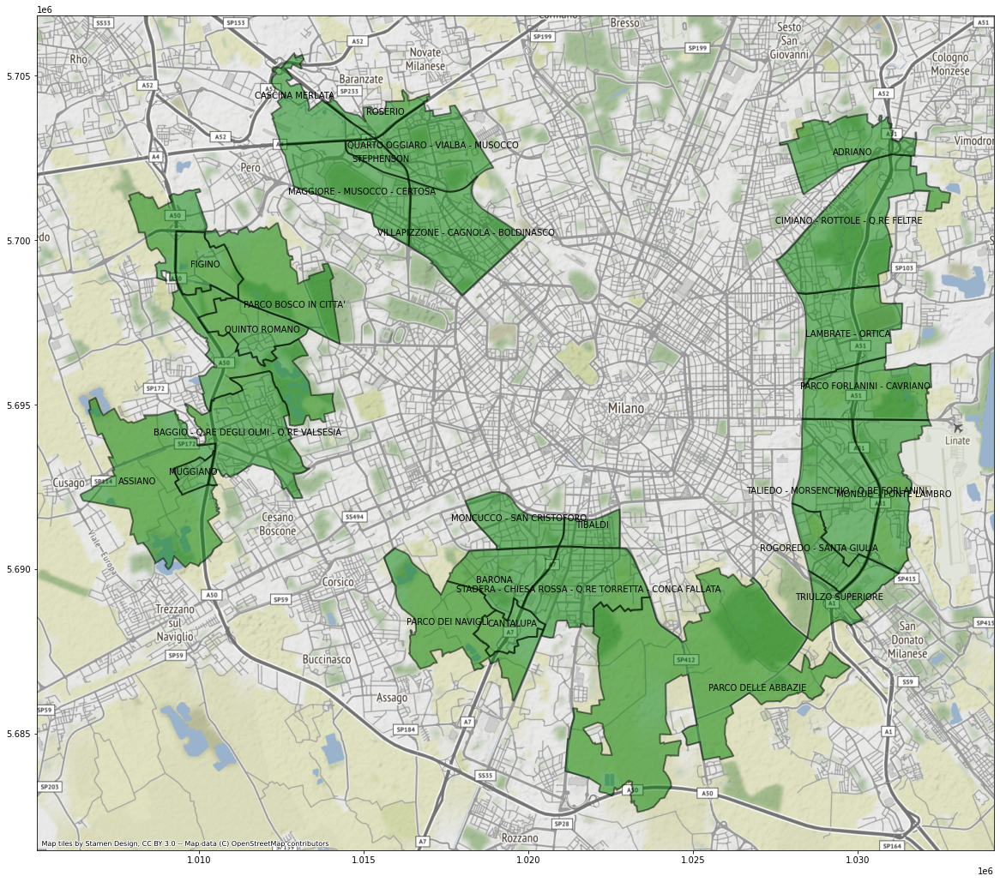

In [ ]:
ax = quartieri_autostradaCopy.plot(figsize = (20,20), facecolor="green", edgecolor="k",linewidth=2, alpha=0.5)
contextily.add_basemap(ax)

for idx, row in quartieri_autostradaCopy.iterrows():
   plt.annotate(s=row["NIL"], xy=row["coords"], horizontalalignment="center", color="k")  